<img src="https://uwe-cyber.github.io/images/uwe_banner.png">

# UFCFEL-15-3 Security Data Analytics and Visualisation
## Portfolio Assignment: Part 3
### Academic year: 2024-25

## Conduct a security investigation into a suspected insider threat
---

**UWEtech** are calling you back once more to help them with their security challenges. They believe that one of their employees has been the cause of their recent security problems, and they believe they may have an insider threat within the company. They enlist your help to examine employee log activity, to see what behaviours deviate from the norm and to identify which user may be acting as a threat to their organisation.

**Dataset:** You will be issued a **unique dataset** based on your UWE student ID. **Failure to use the dataset that corresponds to your student ID will result in zero marks.** Please access the datasets via Blackboard.

**This exercise carries a weight of 45% towards your overall portfolio submission**


### Submission Documents
---

For Part 3 of your portfolio, your complete output file should be saved as:

- **STUDENT_ID-PART3.ipynb**

This should then be included in a ZIP file along with your other two portfolio documents.

The deadline for your portfolio submission is **THURSDAY 12th DECEMBER @ 14:00**. 

## DATASET: Load in the data

**Please provide the string below that you have been assigned as given in the spreadsheet available on Blackboard. The directory containing your dataset should be at the same location as your notebook file.**

In [256]:
# PLEASE ENTER THE NAME OF THE DATASET ASSIGNED TO YOU AS INDICATED ON BLACKBOARD
DATASET = 'QuantumByteSystems'

### Function for loading data - do not change

In [257]:
import random
import string
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import datetime


def load_data(DATASET):
    dataset_list = ['uwetech-dataset01', 'uwetech-dataset02', 'uwetech-dataset03', 'uwetech-dataset04',
                    'CyberWaveSolutions', 'TechNovaInnovations', 'QuantumByteSystems', 'NexGenCyberTech']
    if DATASET in dataset_list:
        email_data = pd.read_csv('./' + DATASET + '/email_data.csv', parse_dates=True, index_col=0)
        file_data = pd.read_csv('./' + DATASET + '/file_data.csv', parse_dates=True, index_col=0)
        web_data = pd.read_csv('./' + DATASET + '/web_data.csv', parse_dates=True, index_col=0)
        login_data = pd.read_csv('./' + DATASET + '/login_data.csv', parse_dates=True, index_col=0)
        usb_data = pd.read_csv('./' + DATASET + '/usb_data.csv', parse_dates=True, index_col=0)
        employee_data = pd.read_csv('./' + DATASET + '/employee_data.csv', index_col=0)
        
        email_data['datetime'] = pd.to_datetime(email_data['datetime'])
        file_data['datetime'] = pd.to_datetime(file_data['datetime'])
        web_data['datetime'] = pd.to_datetime(web_data['datetime'])
        login_data['datetime'] = pd.to_datetime(login_data['datetime'])
        usb_data['datetime'] = pd.to_datetime(usb_data['datetime'])
    else:
        print ("DATASET variable not defined - please refer to Blackboard for DATASET name")
        return
    return employee_data, login_data, usb_data, web_data, file_data, email_data

employee_data, login_data, usb_data, web_data, file_data, email_data = load_data(DATASET)

/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/1112198668.py:14: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  email_data = pd.read_csv('./' + DATASET + '/email_data.csv', parse_dates=True, index_col=0)
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/1112198668.py:15: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  file_data = pd.read_csv('./' + DATASET + '/file_data.csv', parse_dates=True, index_col=0)
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/1112198668.py:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  web_data = 

### The following code samples may be useful to aid your investigation

In [258]:
# This shows the employee_data DataFrame
employee_data

,user,role,email,pc
0,usr-hsr,Finance,usr-hsr@quantumbyte-systems.io,pc0
1,usr-tpu,Legal,usr-tpu@quantumbyte-systems.io,pc1
2,usr-tap,HR,usr-tap@quantumbyte-systems.io,pc2
3,usr-hgw,Director,usr-hgw@quantumbyte-systems.io,pc3
4,usr-rpm,Legal,usr-rpm@quantumbyte-systems.io,pc4
...,...,...,...,...
95,usr-ywk,Technical,usr-ywk@quantumbyte-systems.io,pc95
96,usr-wno,Finance,usr-wno@quantumbyte-systems.io,pc96
97,usr-gri,Legal,usr-gri@quantumbyte-systems.io,pc97
98,usr-czn,HR,usr-czn@quantumbyte-systems.io,pc98


In [259]:
# This shows the login_data DataFrame
login_data

,datetime,user,action,pc
0,2018-01-01 00:12:36,usr-hva,login,pc73
1,2018-01-01 00:25:43,usr-ptq,login,pc64
2,2018-01-01 00:44:31,usr-eir,login,pc75
3,2018-01-01 00:52:56,usr-itq,login,pc81
4,2018-01-01 01:58:34,usr-qhu,login,pc50
...,...,...,...,...
36195,2018-06-30 23:39:18,usr-ptq,logoff,pc64
36196,2018-06-30 23:43:51,usr-eir,logoff,pc75
36197,2018-06-30 23:45:34,usr-lti,logoff,pc47
36198,2018-06-30 23:45:39,usr-sen,logoff,pc60


In [260]:
# This shows how to filter the login_data DataFrame by a particular username
login_data[login_data['user']=='usr-nic']

,datetime,user,action,pc


In [261]:
# This shows how to filter the login_data DataFrame by a particular set of usernames within a list
login_data[login_data['user'].isin(['usr-nic'])]

,datetime,user,action,pc


In [262]:
# all_roles is an array/list of all job roles that are within our DataFrame
all_roles = employee_data['role'].unique()
all_roles

array(['Finance', 'Legal', 'HR', 'Director', 'Security', 'Services',
       'Technical'], dtype=object)

In [263]:
### This sample code helps to create two dictionary objects - user_set and user_set_emails - that group usernames and emails by job role.

user_set = {}
user_set_emails = {}
all_roles = employee_data['role'].unique()
for role in all_roles:
    user_set[role] = list(employee_data[employee_data['role'] == role]['user'].values)
    user_set_emails[role] = list(employee_data[employee_data['role'] == role]['email'].values)

In [264]:
# List all usernames that belong to the job role Finance
user_set['Finance']

['usr-hsr',
 'usr-qmx',
 'usr-eld',
 'usr-sij',
 'usr-pup',
 'usr-bja',
 'usr-sue',
 'usr-pas',
 'usr-svx',
 'usr-uwd',
 'usr-ozf',
 'usr-csj',
 'usr-nsb',
 'usr-nbt',
 'usr-ziz',
 'usr-aby',
 'usr-knd',
 'usr-csf',
 'usr-muz',
 'usr-wno']

### Question 1: For all Finance staff members during the month of January, show the distribution of when users logon and logoff by hour using one or more Bar Charts, and report the most common login and logoff time for this role.

*Hint: Once you have filtered the data to only Finance staff in January, count the number of logons and logoffs that occur in each hour of the day.*

#### (1 mark)

/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/3200968460.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finance_logon_data['hour'] = finance_logon_data['datetime'].dt.hour
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/3200968460.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finance_logoff_data['hour'] = finance_logoff_data['datetime'].dt.hour


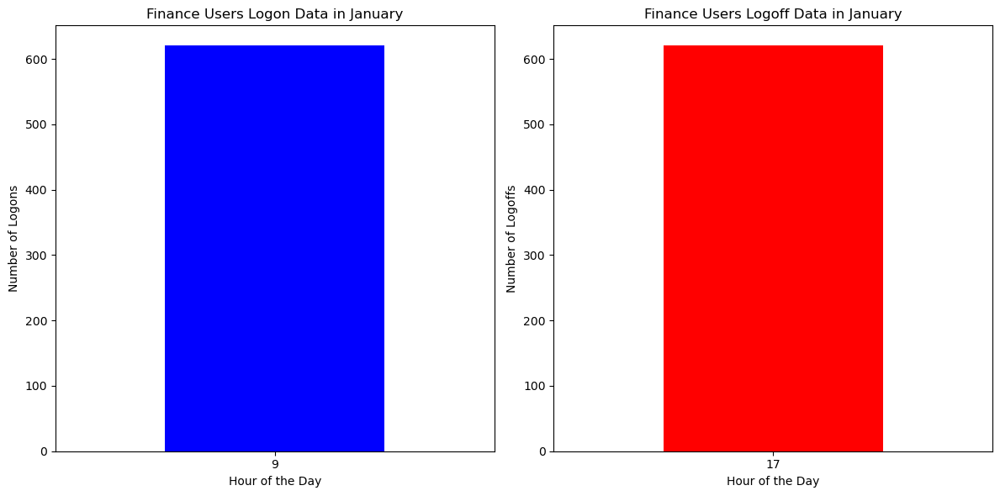

Most common logon time: 9:00
Most common logoff time: 17:00


In [265]:
# ######### ADD YOUR CODE HERE ##########
finance_users = user_set['Finance']

finance_login_data = login_data[(login_data['user'].isin(finance_users)) & (login_data['datetime'].dt.month == 1)]

finance_logon_data = finance_login_data[finance_login_data['action'] == 'login']
finance_logoff_data = finance_login_data[finance_login_data['action'] == 'logoff']

finance_logon_data['hour'] = finance_logon_data['datetime'].dt.hour
finance_logoff_data['hour'] = finance_logoff_data['datetime'].dt.hour

logon_hourly = finance_logon_data.groupby('hour').size()
logoff_hourly = finance_logoff_data.groupby('hour').size()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
logon_hourly.plot(kind='bar', color='blue')
plt.title("Finance Users Logon Data in January")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Logons")
plt.xticks(rotation=0)

plt.subplot(1, 2, 2)
logoff_hourly.plot(kind='bar', color='red')
plt.title("Finance Users Logoff Data in January")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Logoffs")
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

# Report the most common times
most_common_logon = logon_hourly.idxmax()
most_common_logoff = logoff_hourly.idxmax()

print(f"Most common logon time: {most_common_logon}:00")
print(f"Most common logoff time: {most_common_logoff}:00")


### Question 2: Plot a multi-line chart that shows the logon and logoff times during the month of January for the user of pc42.

*Hint: Filter the data as you need, and make two calls to plt.plot().*

#### (1 mark)



/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/3963263507.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pc42_data['date'] = pc42_data['datetime'].dt.date
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/3963263507.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pc42_data['time'] = (pc42_data['datetime'].dt.hour * 3600 + pc42_data['datetime'].dt.minute * 60 + pc42_data['datetime'].dt.second)


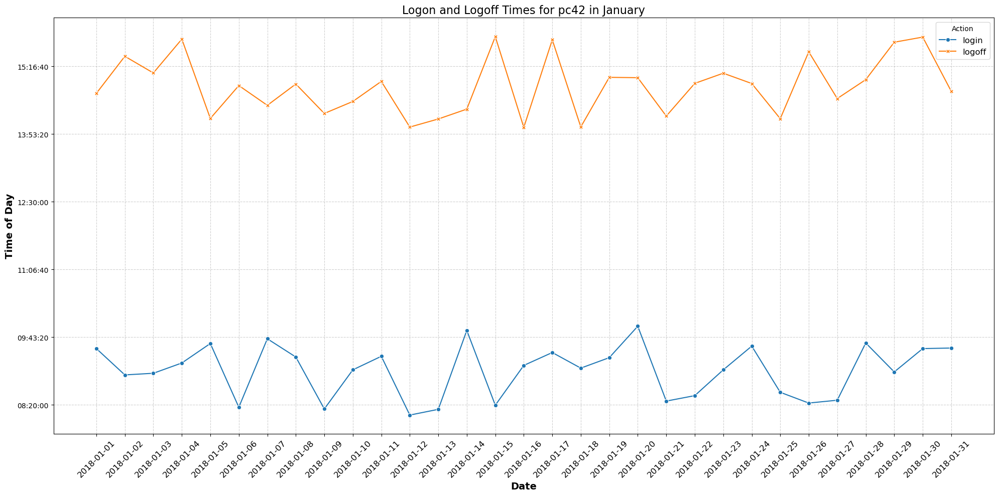

In [266]:
######### ADD YOUR CODE HERE ##########
import pandas as pd

pc42_data = login_data[(login_data['pc'] == 'pc42') & (login_data['datetime'].dt.month == 1)]

pc42_data['date'] = pc42_data['datetime'].dt.date
pc42_data['time'] = (pc42_data['datetime'].dt.hour * 3600 + pc42_data['datetime'].dt.minute * 60 + pc42_data['datetime'].dt.second)


plt.figure(figsize=(20, 10))

sns.lineplot(data=pc42_data,x='date',y='time',hue='action',style='action',markers=True,dashes=False)

def format_seconds(seconds):
    hours = seconds // 3600
    minutes = (seconds % 3600) // 60
    seconds = seconds % 60
    return f"{int(hours):02}:{int(minutes):02}:{int(seconds):02}"

plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: format_seconds(x)))

plt.title("Logon and Logoff Times for pc42 in January", fontsize=16)
plt.xlabel("Date", fontweight='bold' ,fontsize=14)
plt.ylabel("Time of Day", fontweight='bold', fontsize=14)

unique_dates = pc42_data['date'].unique()
plt.xticks(ticks=unique_dates, labels=unique_dates, rotation=45, fontsize=12)
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title="Action", fontsize=12)
plt.show()




### Question 3: Use a node-link graph to show all emails sent by Security staff on January 5th 2018. Your node link graph may show only those users who receive emails from the select senders.

*Hint: Filter the data and then refer back to Question 4 from Part 1 to format the data correctly*

#### (1 mark)

/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/4115614895.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  security_emails['sender_user'] = security_emails['sender'].map(email_to_user)
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/4115614895.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  security_emails['recipient_user'] = security_emails['recipient'].map(email_to_user)


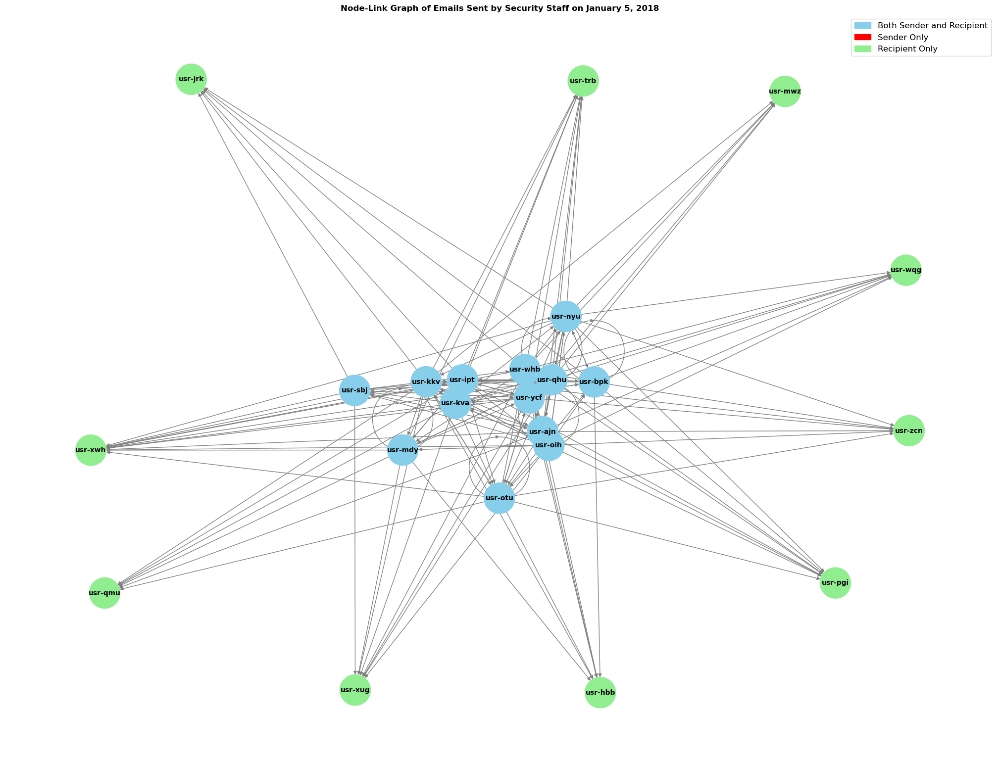

In [291]:
######### ADD YOUR CODE HERE ##########
import matplotlib.patches as mpatches

email_to_user = dict(zip(employee_data['email'], employee_data['user']))

security_user_email_IDs = employee_data[employee_data['role'] == 'Security']['email']
security_emails = email_data[
    (email_data['sender'].isin(security_user_email_IDs)) & 
    (email_data['datetime'].dt.date == pd.Timestamp('2018-01-05').date())
]

security_emails['sender_user'] = security_emails['sender'].map(email_to_user)
security_emails['recipient_user'] = security_emails['recipient'].map(email_to_user)

edges = list(zip(security_emails['sender_user'], security_emails['recipient_user']))

G = nx.DiGraph()
G.add_edges_from(edges)

senders = set(security_emails['sender_user'])
recipients = set(security_emails['recipient_user'])

node_colors = []
for node in G.nodes():
    if node in senders and node in recipients:
        node_colors.append('skyblue')  
    elif node in senders:
        node_colors.append('red')  
    elif node in recipients:
        node_colors.append('lightgreen') 
    else:
        None  

plt.figure(figsize=(20, 15))
pos = nx.spring_layout(G)
nx.draw(
    G, pos, with_labels=True, node_size=2000, 
    node_color=node_colors, font_size=10, font_weight='bold', edge_color='gray'
)

plt.title("Node-Link Graph of Emails Sent by Security Staff on January 5, 2018", fontweight='bold')
sender_and_recipient_patch = mpatches.Patch(color='skyblue', label='Both Sender and Recipient')
sender_patch = mpatches.Patch(color='red', label='Sender Only')
recipient_patch = mpatches.Patch(color='lightgreen', label='Recipient Only')
neither_patch = mpatches.Patch(color='grey', label='Neither')
plt.legend(handles=[sender_and_recipient_patch, sender_patch, recipient_patch], loc='upper right', fontsize=12)

plt.show()




### (Advanced) Question 4: Extend the above, now showing a node for every possible user. The edge connections should be as above, for emails sent by Security staff on 5th January 2022. You should use a shell layout for your network plot.

*Hint: Think about how to include all users as nodes. You may even include a dummy node and remove this in your processing depending on how you form your edgelist - https://networkx.org/documentation/stable/index.html*

#### (3 marks)

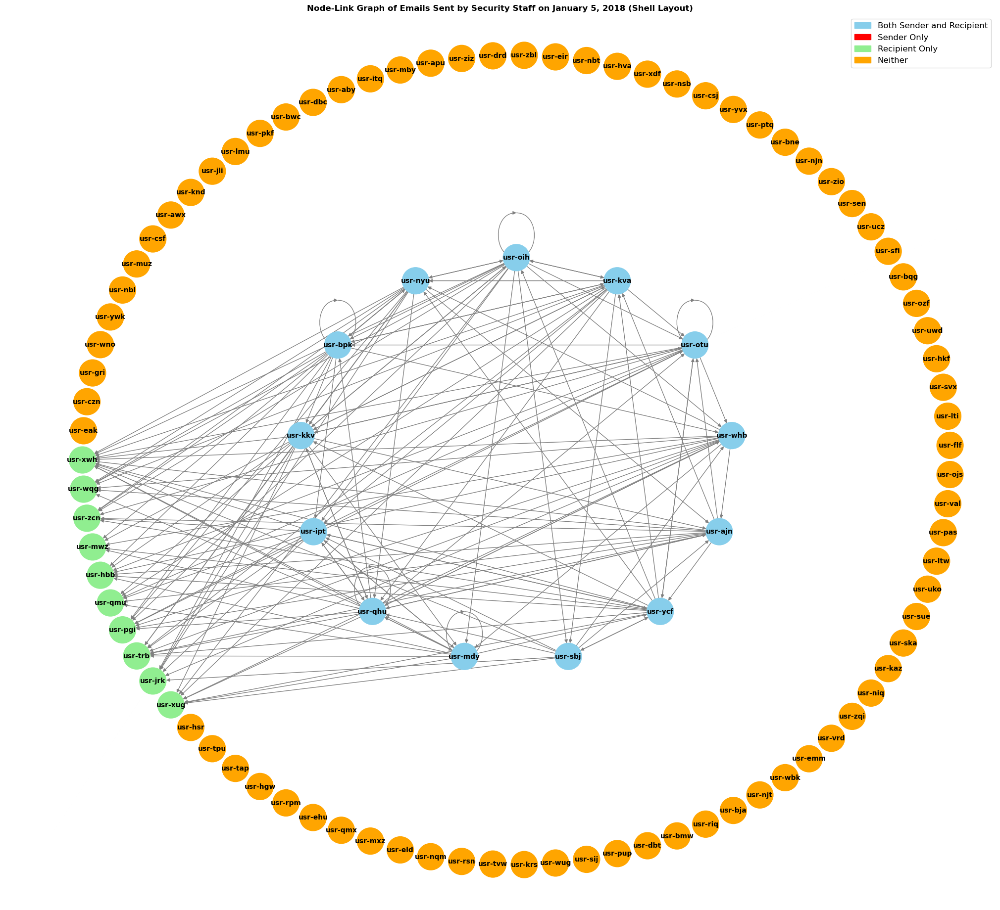

In [268]:
######### ADD YOUR CODE HERE ##########
# ANSWER
G = nx.DiGraph()
G.add_edges_from(edges)

all_users = employee_data['user'].tolist()
G.add_nodes_from(all_users)

senders = set(security_emails['sender_user'])
recipients = set(security_emails['recipient_user'])

node_colors = []
inner_shell = []  
outer_shell = []  

for node in G.nodes():
    if node in senders and node in recipients:
        node_colors.append('skyblue')  
        inner_shell.append(node)
    else:
        if node in senders:
            node_colors.append('red')  
        elif node in recipients:
            node_colors.append('lightgreen')  
        else:
            node_colors.append('orange')  
        outer_shell.append(node)

shells = [inner_shell, outer_shell]

plt.figure(figsize=(20, 18))

nx.draw_shell(G, shells, 
              with_labels=True,  
              node_size=1500,
              node_color=node_colors,  
              font_size=10,
              font_weight="bold",
              edge_color="gray")

plt.title("Node-Link Graph of Emails Sent by Security Staff on January 5, 2018 (Shell Layout)", fontweight='bold')
sender_and_recipient_patch = mpatches.Patch(color='skyblue', label='Both Sender and Recipient')
sender_patch = mpatches.Patch(color='red', label='Sender Only')
recipient_patch = mpatches.Patch(color='lightgreen', label='Recipient Only')
neither_patch = mpatches.Patch(color='orange', label='Neither')
plt.legend(handles=[sender_and_recipient_patch, sender_patch, recipient_patch, neither_patch], loc='upper right', fontsize=12)

plt.show()



### Question 5: Show a comparison between the files accessed by HR staff, Services staff, and Security staff, during January. You will need to think of a suitable way to convey this information within a single plot so that comparison of activity can be made easily.

*Hint: Think which plot enables you to make comparisons between two attributes, and then think what the attributes would need to be for mapping three job roles against the possible set of files accessed.*

#### (4 marks)

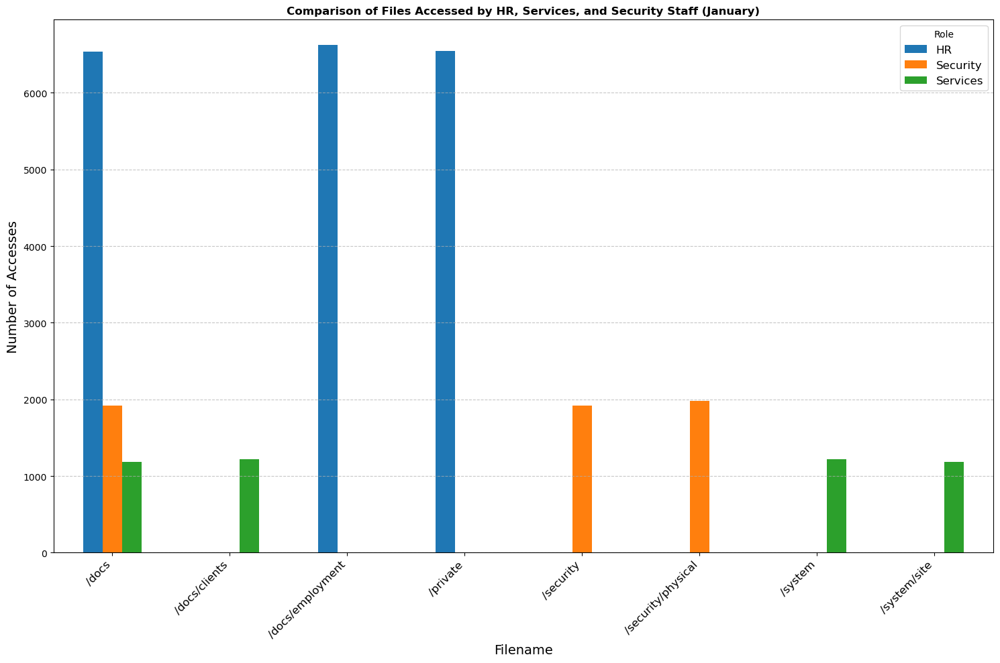

In [269]:
######### ADD YOUR CODE HERE ##########
file_data_jan = file_data[file_data['datetime'].dt.month == 1]

merged_data_jan = pd.merge(file_data_jan, employee_data, on='user', how='inner')

roles = ['HR', 'Services', 'Security']
filtered_data = merged_data_jan[merged_data_jan['role'].isin(roles)]

grouped_data = filtered_data.groupby(['filename','role']).size().reset_index(name='access_count')

pivot_data = grouped_data.pivot(index='filename', columns='role', values='access_count').fillna(0)

pivot_data.plot(kind='bar', figsize=(15,10))

plt.title("Comparison of Files Accessed by HR, Services, and Security Staff (January)", fontweight='bold')
plt.xlabel("Filename", fontsize=14)
plt.ylabel("Number of Accesses", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)

plt.legend(title="Role", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




### Question 6: Carry on your own investigation to find the anomalous activity across all data files provided. Provide clear evidence and justification for your investigative steps.

Marks are awarded for: 
- a clear explanation of the steps you take to complete your investigation (5)
- suitable use of data analysis with clear explanation (6)
- suitable use of visualisation methods with clear annotation (6)
- identifying all of the suspicious events (8)

#### (25 marks)

### To begin with, i produced heatmaps of login and logoff times of all the users, separated them based on their role.

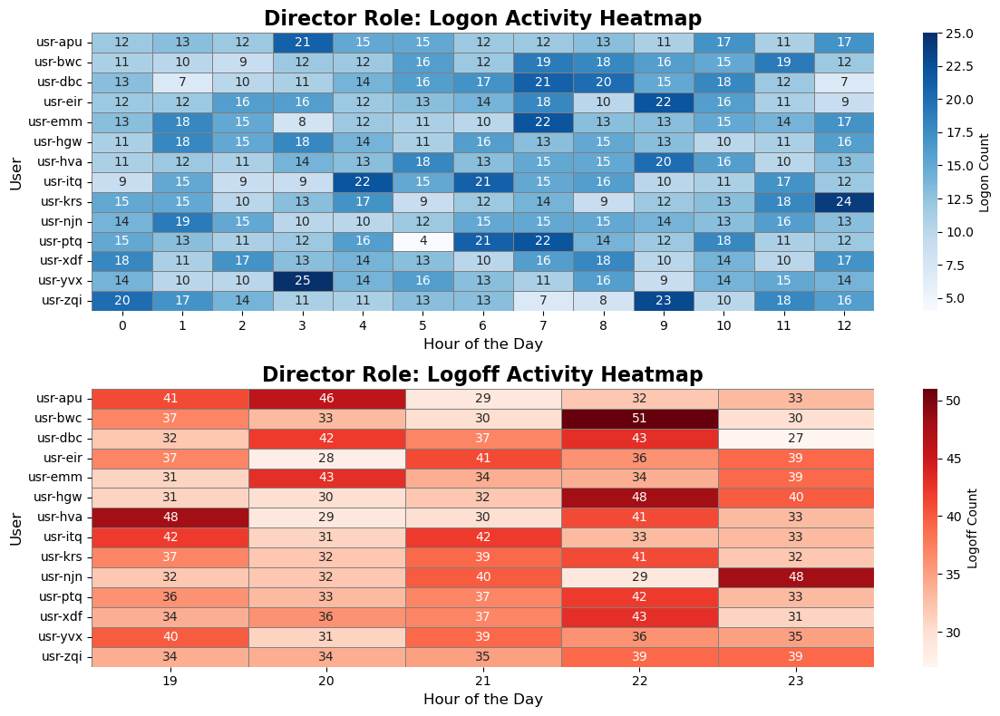

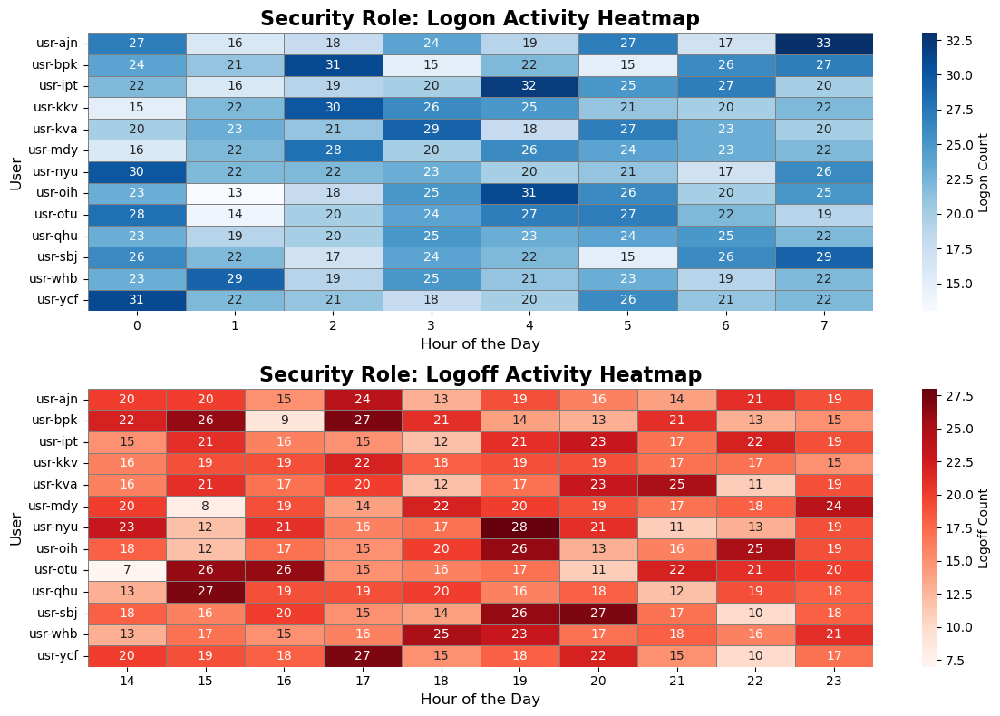

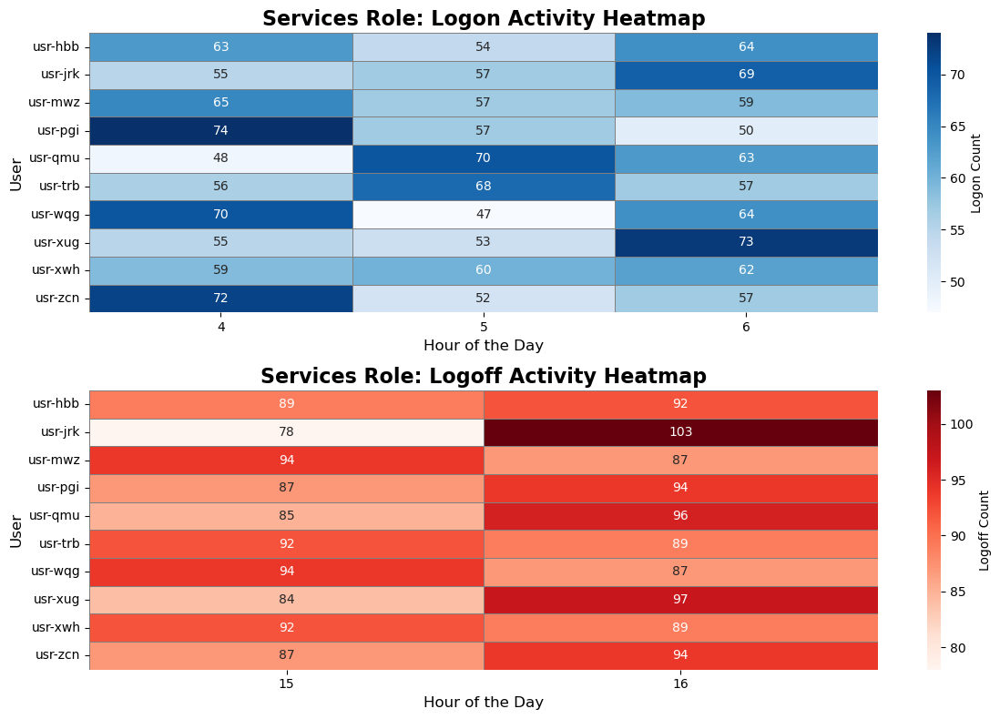

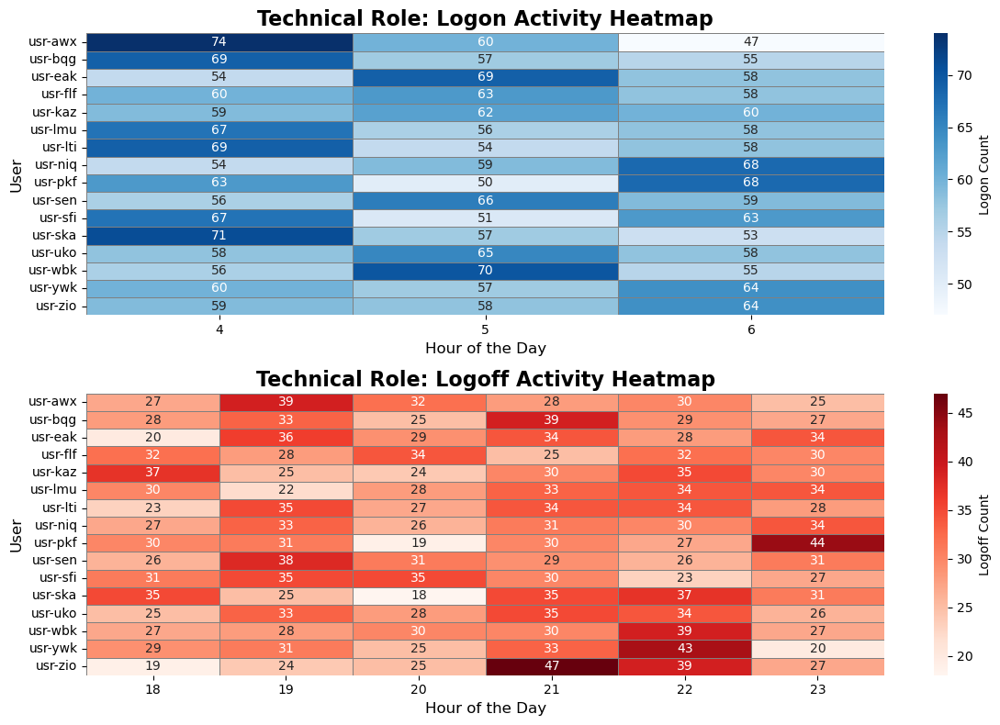

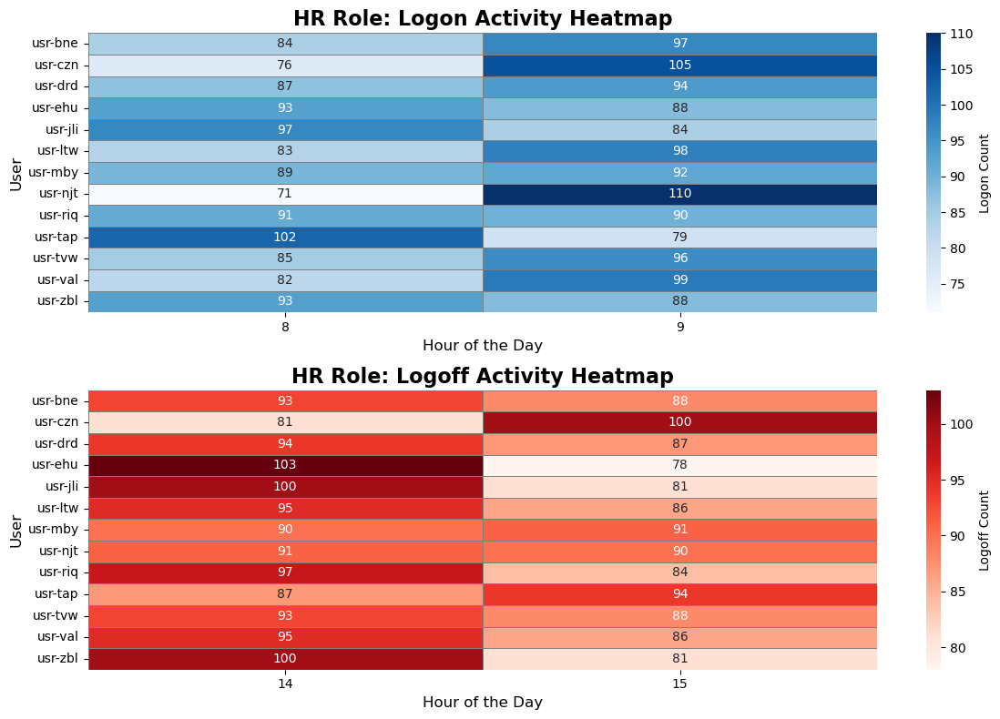

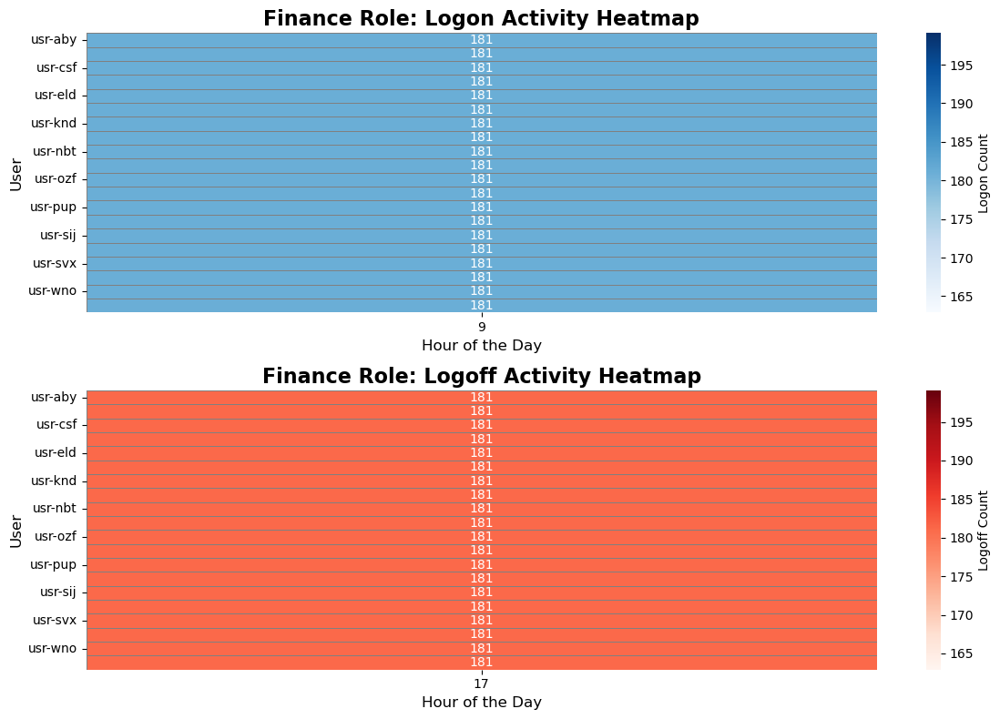

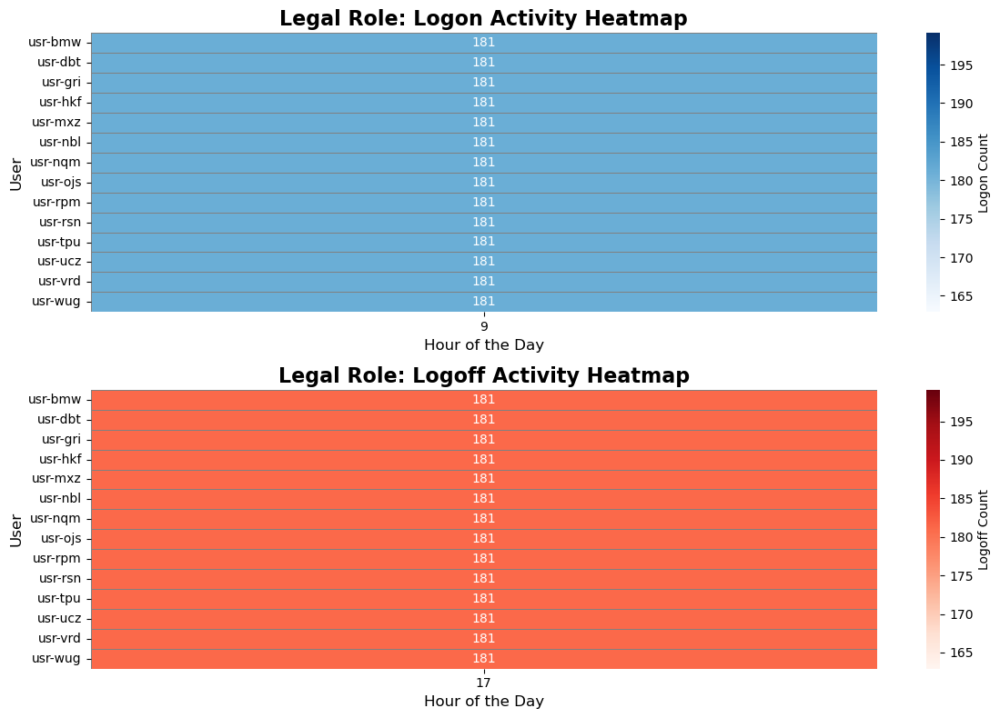

In [270]:
merged_login_data = pd.merge(login_data, employee_data, on='user', how='inner')

merged_login_data['hour'] = merged_login_data['datetime'].dt.hour

roles = merged_login_data['role'].unique()

def prepare_login_heatmap_data(data):
    heatmap_data = data.groupby(['user', 'hour']).size().reset_index(name='count')
    heatmap_pivot = heatmap_data.pivot(index='user', columns='hour', values='count').fillna(0)
    return heatmap_pivot

for role in roles:
    role_data = merged_login_data[merged_login_data['role'] == role]
    
    logon_data = role_data[role_data['action'] == 'login']
    logoff_data = role_data[role_data['action'] == 'logoff']

    logon_heatmap_data = prepare_login_heatmap_data(logon_data)
    logoff_heatmap_data = prepare_login_heatmap_data(logoff_data)
    
    plt.figure(figsize=(12, 8))
    
    plt.subplot(2, 1, 1)
    sns.heatmap(logon_heatmap_data, cmap="Blues", linewidths=0.5, linecolor="gray",  annot=True, fmt="g" , cbar_kws={'label': 'Logon Count'})
    plt.title(f"{role} Role: Logon Activity Heatmap", fontsize=16, fontweight='bold')
    plt.xlabel("Hour of the Day", fontsize=12)
    plt.ylabel("User", fontsize=12)
    
    plt.subplot(2, 1, 2)
    sns.heatmap(logoff_heatmap_data, cmap="Reds", linewidths=0.5, linecolor="gray",  annot=True, fmt="g" , cbar_kws={'label': 'Logoff Count'})
    plt.title(f"{role} Role: Logoff Activity Heatmap", fontsize=16, fontweight='bold')
    plt.xlabel("Hour of the Day", fontsize=12)
    plt.ylabel("User", fontsize=12)
    
    plt.tight_layout()
    plt.show()

### The results above does not any anomalous activity just by themselves. Can be useful to refer back.

### Then i checked if any user has logged in the PC that is not their assigned PC. The results below shows that no user has logged in an unauthorised pc.

In [271]:
user_pc_mapping = dict(zip(employee_data['user'], employee_data['pc']))

mismatched_logins = []

for index, row in login_data.iterrows():
    user = row['user']
    logged_pc = row['pc']
    
    if user in user_pc_mapping:
        assigned_pc = user_pc_mapping[user]
        
        if logged_pc != assigned_pc:
            mismatched_logins.append({
                'user': user,
                'assigned_pc': assigned_pc,
                'logged_pc': logged_pc,
                'datetime': row['datetime']
            })

mismatched_logins_df = pd.DataFrame(mismatched_logins)

print(mismatched_logins_df)

Empty DataFrame
Columns: []
Index: []


### Since there are no unauthorised PC logins, i checked if there are any users with multiple emails and PCs. The results show that all the users (100), emails (100), and PCs (100) unique values are equal. This proves that every user is associated with exactly one unique email and PC.

In [272]:
employee_data.nunique()

user     100
role       7
email    100
pc       100
dtype: int64

### the node-link diagrams below visualises the user and email/pc connections, proving that every user has exactly one PC/email.

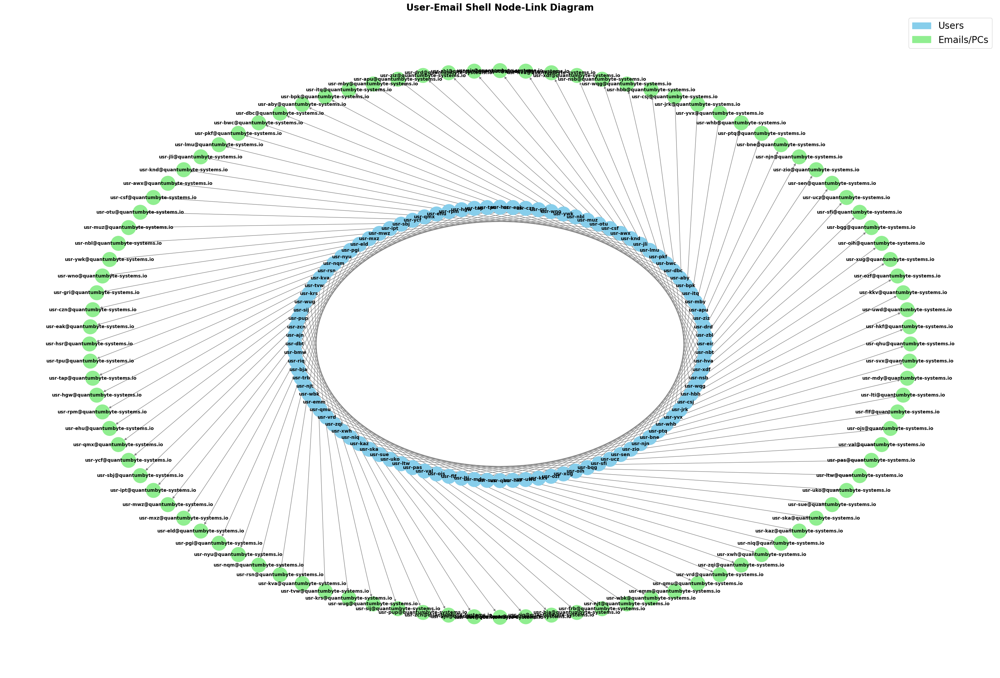

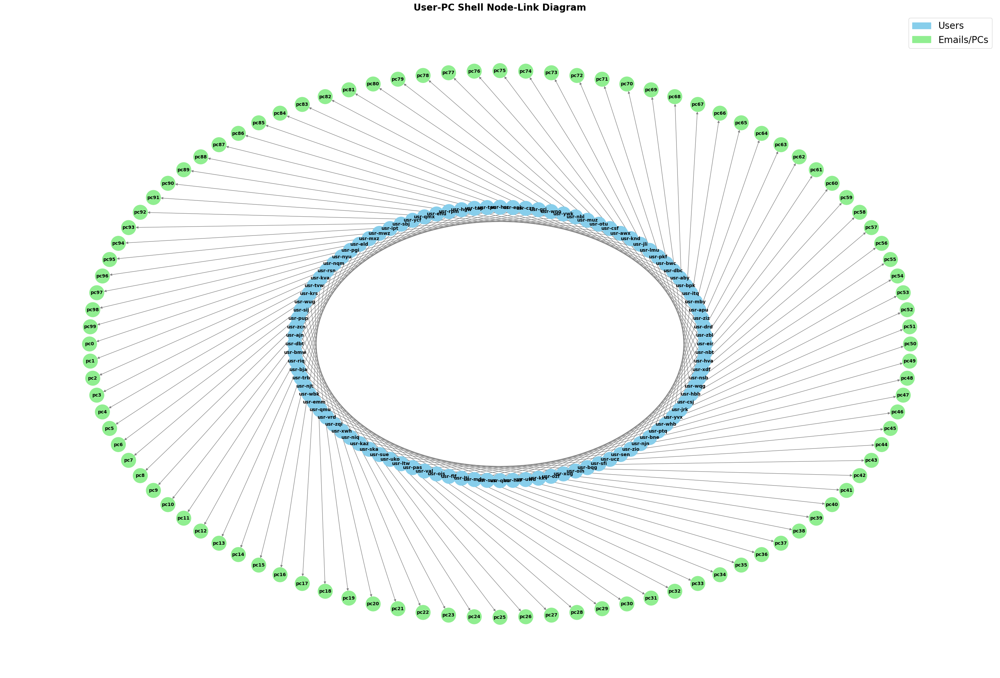

In [273]:
def draw_shell_node_link_diagram(df, source_col, target_col, title):
    G = nx.DiGraph()

    for _, row in df.iterrows():
        G.add_edge(row[source_col], row[target_col])

    nodes_source = list(df[source_col].unique())
    nodes_target = list(df[target_col].unique())
    shells = [nodes_source, nodes_target]

    node_colors = []
    for node in G.nodes():
        if node in nodes_source:
            node_colors.append("skyblue")  
        elif node in nodes_target:
            node_colors.append("lightgreen")  
        else:
            node_colors.append("lightgray")

    plt.figure(figsize=(30, 20))
    pos = nx.shell_layout(G, shells)  
    nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1000, font_size=10, font_weight="bold", edge_color="gray")
    plt.title(title, fontweight='bold' , fontsize=20)
    user_patch = mpatches.Patch(color="skyblue", label="Users")
    target_patch = mpatches.Patch(color="lightgreen", label="Emails/PCs")
    plt.legend(handles=[user_patch, target_patch], loc="upper right", fontsize=20)
    plt.show()

draw_shell_node_link_diagram(employee_data, source_col="user", target_col="email", title="User-Email Shell Node-Link Diagram")
draw_shell_node_link_diagram(employee_data, source_col="user", target_col="pc", title="User-PC Shell Node-Link Diagram")

### And then i checked if there are any users who used usb on the PCs that are not assigned them. The results below show that 'usr-zqi' who's assigned PC is 'pc35' has used usb on 'pc99' 8 times on the dates '2018-04-22' and '2018-04-24'.

In [274]:
mismatched_usb_uses = []

for index, row in usb_data.iterrows():
    user = row['user']
    usb_pc = row['pc']
    
    if user in user_pc_mapping:
        assigned_pc = user_pc_mapping[user]
        
        if usb_pc != assigned_pc:
            mismatched_usb_uses.append({
                'user': user,
                'assigned_pc': assigned_pc,
                'usb_pc': usb_pc,
                'datetime': row['datetime'],
                'action': row['action']  
            })

mismatched_usb_uses_df = pd.DataFrame(mismatched_usb_uses)

mismatched_usb_uses_df



,user,assigned_pc,usb_pc,datetime,action
0,usr-zqi,pc35,pc99,2018-04-22 19:45:35.263826,usb_insert
1,usr-zqi,pc35,pc99,2018-04-22 19:47:25.300702,usb_insert
2,usr-zqi,pc35,pc99,2018-04-22 19:55:19.221029,usb_remove
3,usr-zqi,pc35,pc99,2018-04-22 20:16:08.356949,usb_remove
4,usr-zqi,pc35,pc99,2018-04-24 03:51:30.708095,usb_insert
5,usr-zqi,pc35,pc99,2018-04-24 04:15:56.888653,usb_remove
6,usr-zqi,pc35,pc99,2018-04-24 07:12:44.173070,usb_insert
7,usr-zqi,pc35,pc99,2018-04-24 07:31:50.111437,usb_remove


### I have printed out the employee data of 'pc35' along with 'pc99' to see if there is any overlapping which i was missing. The results show that there isn't any overlapping, both the PCs are assigned to different users belonging to different roles.

In [275]:
# login_data[login_data['user']=='usr-zqi']

print(employee_data[employee_data['pc']=='pc35'])
print(employee_data[employee_data['pc']=='pc99'])

       user      role                           email    pc
35  usr-zqi  Director  usr-zqi@quantumbyte-systems.io  pc35
       user       role                           email    pc
99  usr-eak  Technical  usr-eak@quantumbyte-systems.io  pc99


### then i have checked the 'usr-zqi' login and logoff times on 'pc35'on the date he used usb on 'pc99'. The results show that he was active on his own PC (pc35) the dates he misused usb.

In [276]:
user_to_check1 = 'usr-zqi'
specific_dates = ['2018-04-22', '2018-04-24']

filtered_data1 = login_data[
    (login_data['user'] == user_to_check1) &
    (login_data['action'].isin(['login', 'logoff'])) & 
    (login_data['datetime'].dt.date.isin(pd.to_datetime(specific_dates).date))
]

filtered_data1

,datetime,user,action,pc
22299,2018-04-22 12:36:15,usr-zqi,login,pc35
22375,2018-04-22 19:55:51,usr-zqi,logoff,pc35
22608,2018-04-24 03:28:55,usr-zqi,login,pc35
22774,2018-04-24 20:01:54,usr-zqi,logoff,pc35


### scatter plot shows usr-zqi activity timeline on dates '2018-04-22' and '2018-04-24'

/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/1434706056.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  usr_eak_login['date'] = usr_eak_login['datetime'].dt.date
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/1434706056.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  usr_eak_login['time_seconds'] = usr_eak_login['datetime'].dt.hour * 3600 + usr_eak_login['datetime'].dt.minute * 60 + usr_eak_login['datetime'].dt.second
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n2400

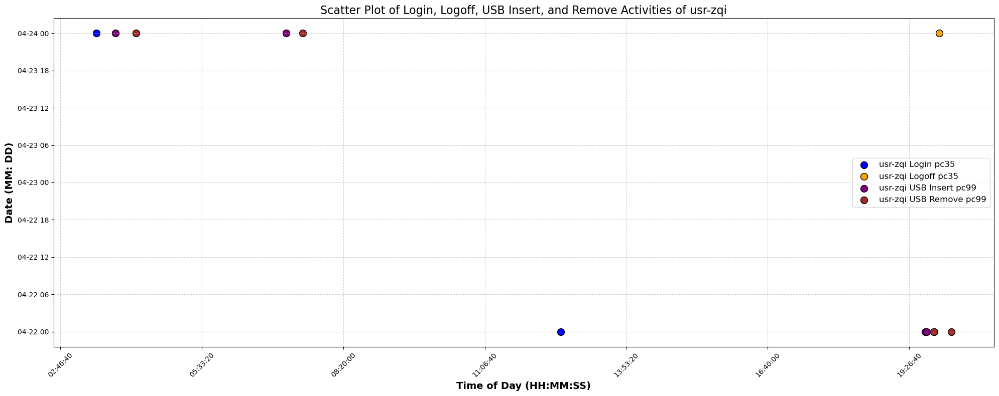

In [277]:
specific_dates = ['2018-04-22', '2018-04-24']
usr_eak_login = login_data[
    (login_data['user'] == 'usr-eak') & 
    (login_data['action'].isin(['login', 'logoff'])) & 
    (login_data['datetime'].dt.date.isin(pd.to_datetime(specific_dates).date))
]
usr_zqi_login = login_data[
    (login_data['user'] == 'usr-zqi') & 
    (login_data['action'].isin(['login', 'logoff'])) & 
    (login_data['datetime'].dt.date.isin(pd.to_datetime(specific_dates).date))
]
usr_zqi_usb = mismatched_usb_uses_df[
    (mismatched_usb_uses_df['user'] == 'usr-zqi') & 
    (mismatched_usb_uses_df['datetime'].dt.date.isin(pd.to_datetime(specific_dates).date))
]

usr_eak_login['date'] = usr_eak_login['datetime'].dt.date
usr_eak_login['time_seconds'] = usr_eak_login['datetime'].dt.hour * 3600 + usr_eak_login['datetime'].dt.minute * 60 + usr_eak_login['datetime'].dt.second

usr_zqi_login['date'] = usr_zqi_login['datetime'].dt.date
usr_zqi_login['time_seconds'] = usr_zqi_login['datetime'].dt.hour * 3600 + usr_zqi_login['datetime'].dt.minute * 60 + usr_zqi_login['datetime'].dt.second

usr_zqi_usb['date'] = usr_zqi_usb['datetime'].dt.date
usr_zqi_usb['time_seconds'] = usr_zqi_usb['datetime'].dt.hour * 3600 + usr_zqi_usb['datetime'].dt.minute * 60 + usr_zqi_usb['datetime'].dt.second

plt.figure(figsize=(20, 8))

# Plot usr-zqi login events
plt.scatter(
    usr_zqi_login[usr_zqi_login['action'] == 'login']['time_seconds'],
    usr_zqi_login[usr_zqi_login['action'] == 'login']['date'],
    color='blue', label='usr-zqi Login pc35', s=100, edgecolors='black'
)

# Plot usr-zqi logoff events
plt.scatter(
    usr_zqi_login[usr_zqi_login['action'] == 'logoff']['time_seconds'],
    usr_zqi_login[usr_zqi_login['action'] == 'logoff']['date'],
    color='orange', label='usr-zqi Logoff pc35', s=100, edgecolors='black'
)

# Plot usr-zqi USB insert events
plt.scatter(
    usr_zqi_usb[usr_zqi_usb['action'] == 'usb_insert']['time_seconds'],
    usr_zqi_usb[usr_zqi_usb['action'] == 'usb_insert']['date'],
    color='purple', label='usr-zqi USB Insert pc99', s=100, edgecolors='black'
)

# Plot usr-zqi USB remove events
plt.scatter(
    usr_zqi_usb[usr_zqi_usb['action'] == 'usb_remove']['time_seconds'],
    usr_zqi_usb[usr_zqi_usb['action'] == 'usb_remove']['date'],
    color='brown', label='usr-zqi USB Remove pc99', s=100, edgecolors='black'
)

plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{int(x // 3600):02}:{int((x % 3600) // 60):02}:{int(x % 60):02}"))
plt.xticks(rotation=45)
plt.xlabel("Time of Day (HH:MM:SS)", fontweight='bold', fontsize=14)
plt.ylabel("Date (MM: DD)", fontweight='bold', fontsize=14)
plt.title("Scatter Plot of Login, Logoff, USB Insert, and Remove Activities of usr-zqi", fontsize=16)
plt.legend(loc='center right', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

### The scatter plot above shows that 'usr-zqi' used usb on pc99 after logging out of pc35 on '2018-04-22' and then on '2018-04-24' he used usb 2 times on pc99 while he was logged in on pc35

### Now i have checked the 'usr-eak' login and logoff times on the date his PC (pc99) was used by 'usr-zqi' for usb. The results show that he was active on those days.

In [278]:
user_to_check2 = 'usr-eak'
specific_dates = ['2018-04-22', '2018-04-24']

filtered_data2 = login_data[
    (login_data['user'] == user_to_check2) &
    (login_data['action'].isin(['login', 'logoff'])) &  
    (login_data['datetime'].dt.date.isin(pd.to_datetime(specific_dates).date))
]

filtered_data2

,datetime,user,action,pc
22235,2018-04-22 06:25:34,usr-eak,login,pc99
22373,2018-04-22 19:40:41,usr-eak,logoff,pc99
22620,2018-04-24 04:52:22,usr-eak,login,pc99
22788,2018-04-24 22:26:14,usr-eak,logoff,pc99


###  The scatter chart below shows the timeline of 'usr-zqi' 'usb_insert' and 'usb_remove'; and 'usr-eak' login and logoff on the 'pc99' between the dates '2018-04-22' and '2018-04-24'. 

/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/1752215605.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  usr_eak_login['date'] = usr_eak_login['datetime'].dt.date
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/1752215605.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  usr_eak_login['time_seconds'] = usr_eak_login['datetime'].dt.hour * 3600 + usr_eak_login['datetime'].dt.minute * 60 + usr_eak_login['datetime'].dt.second
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n2400

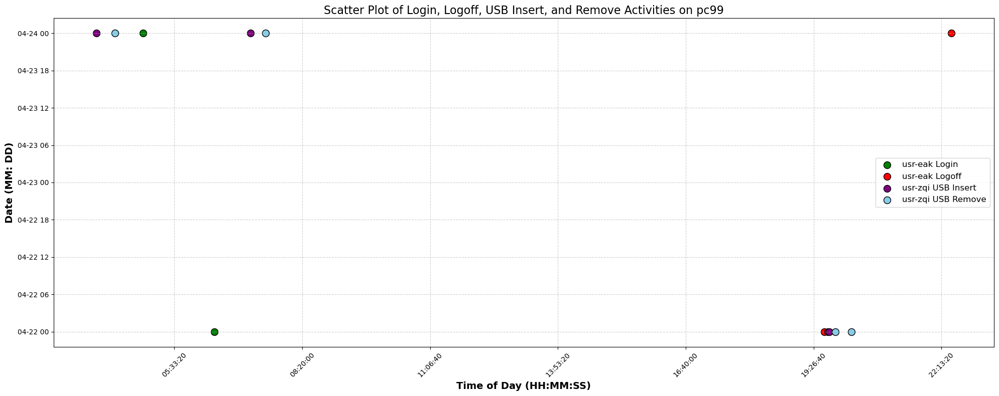

In [279]:
specific_dates = ['2018-04-22', '2018-04-24']
usr_eak_login = login_data[
    (login_data['user'] == 'usr-eak') & 
    (login_data['action'].isin(['login', 'logoff'])) & 
    (login_data['datetime'].dt.date.isin(pd.to_datetime(specific_dates).date))
]
usr_zqi_login = login_data[
    (login_data['user'] == 'usr-zqi') & 
    (login_data['action'].isin(['login', 'logoff'])) & 
    (login_data['datetime'].dt.date.isin(pd.to_datetime(specific_dates).date))
]
usr_zqi_usb = mismatched_usb_uses_df[
    (mismatched_usb_uses_df['user'] == 'usr-zqi') & 
    (mismatched_usb_uses_df['datetime'].dt.date.isin(pd.to_datetime(specific_dates).date))
]

usr_eak_login['date'] = usr_eak_login['datetime'].dt.date
usr_eak_login['time_seconds'] = usr_eak_login['datetime'].dt.hour * 3600 + usr_eak_login['datetime'].dt.minute * 60 + usr_eak_login['datetime'].dt.second

usr_zqi_login['date'] = usr_zqi_login['datetime'].dt.date
usr_zqi_login['time_seconds'] = usr_zqi_login['datetime'].dt.hour * 3600 + usr_zqi_login['datetime'].dt.minute * 60 + usr_zqi_login['datetime'].dt.second

usr_zqi_usb['date'] = usr_zqi_usb['datetime'].dt.date
usr_zqi_usb['time_seconds'] = usr_zqi_usb['datetime'].dt.hour * 3600 + usr_zqi_usb['datetime'].dt.minute * 60 + usr_zqi_usb['datetime'].dt.second

plt.figure(figsize=(20, 8))

# Plot usr-eak login events
plt.scatter(
    usr_eak_login[usr_eak_login['action'] == 'login']['time_seconds'],
    usr_eak_login[usr_eak_login['action'] == 'login']['date'],
    color='green', label='usr-eak Login', s=100, edgecolors='black'
)

# Plot usr-eak logoff events
plt.scatter(
    usr_eak_login[usr_eak_login['action'] == 'logoff']['time_seconds'],
    usr_eak_login[usr_eak_login['action'] == 'logoff']['date'],
    color='red', label='usr-eak Logoff', s=100, edgecolors='black'
)

# Plot usr-zqi USB insert events
plt.scatter(
    usr_zqi_usb[usr_zqi_usb['action'] == 'usb_insert']['time_seconds'],
    usr_zqi_usb[usr_zqi_usb['action'] == 'usb_insert']['date'],
    color='purple', label='usr-zqi USB Insert', s=100, edgecolors='black'
)

# Plot usr-zqi USB remove events
plt.scatter(
    usr_zqi_usb[usr_zqi_usb['action'] == 'usb_remove']['time_seconds'],
    usr_zqi_usb[usr_zqi_usb['action'] == 'usb_remove']['date'],
    color='skyblue', label='usr-zqi USB Remove', s=100, edgecolors='black'
)

plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{int(x // 3600):02}:{int((x % 3600) // 60):02}:{int(x % 60):02}"))
plt.xticks(rotation=45)
plt.xlabel("Time of Day (HH:MM:SS)", fontweight='bold', fontsize=14)
plt.ylabel("Date (MM: DD)", fontweight='bold', fontsize=14)
plt.title("Scatter Plot of Login, Logoff, USB Insert, and Remove Activities on pc99", fontsize=16)
plt.legend(loc='center right', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()



### The above results show that 'usr-zqi' used usb on pc99 once on 22-04-2018 after 'usr-eak' logged out . then twice on 24-04-2018, once before 'usr-eak' logged in and then once while he was logged in.

### The below results show that 'usr-zqi' is the only user in director role that has used usb, no one else did. He used it 8 times.

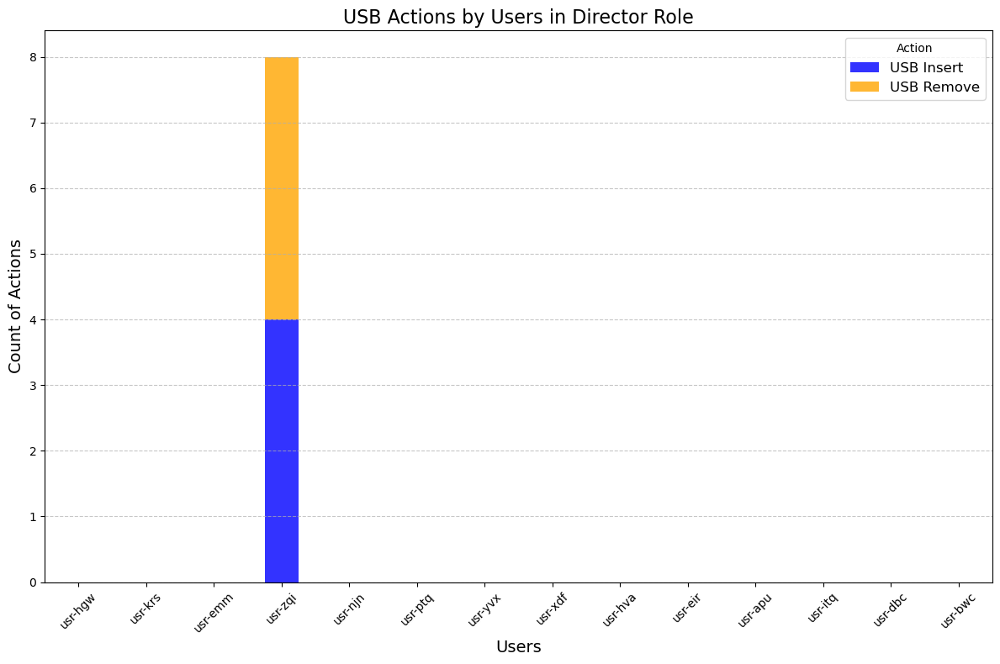

In [280]:
director_users = employee_data[employee_data['role'] == 'Director']['user'].unique()

director_usb_data = usb_data[usb_data['user'].isin(director_users)]

usb_action_counts = director_usb_data.groupby(['user', 'action']).size().unstack(fill_value=0)

usb_action_counts = usb_action_counts.reindex(director_users, fill_value=0)

usb_action_counts.plot(
    kind='bar', 
    stacked=True, 
    figsize=(12, 8), 
    color=['blue', 'orange'], 
    alpha=0.8
)

plt.title("USB Actions by Users in Director Role", fontsize=16)
plt.xlabel("Users", fontsize=14)
plt.ylabel("Count of Actions", fontsize=14)
plt.legend(title="Action", fontsize=12, labels=["USB Insert", "USB Remove"])
plt.xticks(rotation=45, fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### The results below show that all the 8 usb activities by 'usr-zqi' was done on pc99 which is not his pc.

In [281]:
usb_data[usb_data['user']=='usr-zqi']

,datetime,user,action,pc
44366,2018-04-22 19:45:35.263826,usr-zqi,usb_insert,pc99
44368,2018-04-22 19:47:25.300702,usr-zqi,usb_insert,pc99
44371,2018-04-22 19:55:19.221029,usr-zqi,usb_remove,pc99
44373,2018-04-22 20:16:08.356949,usr-zqi,usb_remove,pc99
44782,2018-04-24 03:51:30.708095,usr-zqi,usb_insert,pc99
44783,2018-04-24 04:15:56.888653,usr-zqi,usb_remove,pc99
44800,2018-04-24 07:12:44.173070,usr-zqi,usb_insert,pc99
44808,2018-04-24 07:31:50.111437,usr-zqi,usb_remove,pc99


### The heatmap below shows that 'usr-zqi' file accessing pattern is the similar to all the other directors except that he has accessed '/docs/clients' 5 times, no director has ever accessed that file.

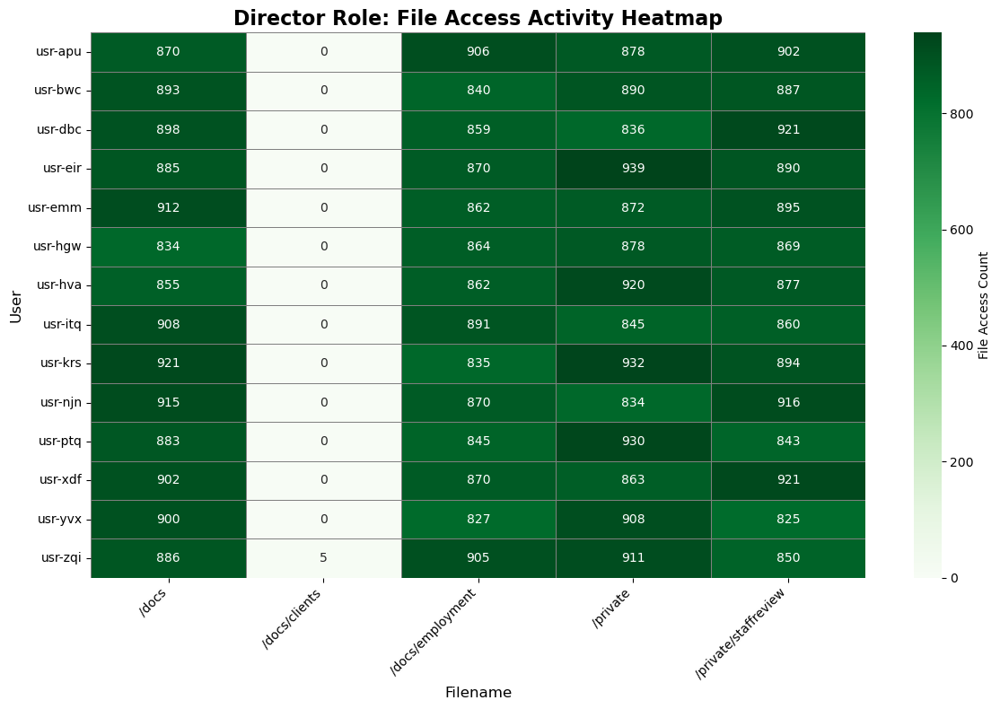

In [282]:

director_merged_file_data = pd.merge(file_data, employee_data, on='user', how='inner')

director_data = director_merged_file_data[director_merged_file_data['role'] == 'Director']

def prepare_file_heatmap_data(data):
    heatmap_data = data.groupby(['user', 'filename']).size().reset_index(name='count')
    heatmap_pivot = heatmap_data.pivot(index='user', columns='filename', values='count').fillna(0)
    return heatmap_pivot

heatmap_data = prepare_file_heatmap_data(director_data)

plt.figure(figsize=(12, 8))
sns.heatmap(
    heatmap_data, 
    cmap="Greens", 
    linewidths=0.5, 
    linecolor="gray",
    annot=True, 
    fmt="g",   
    cbar_kws={'label': 'File Access Count'}
)
plt.title("Director Role: File Access Activity Heatmap", fontsize=16, fontweight='bold')
plt.xlabel("Filename", fontsize=12)
plt.ylabel("User", fontsize=12)
plt.xticks(rotation=45, ha='right') 
plt.tight_layout()
plt.show()

### The result below shows the activities happened on 'pc99' on the date and time when 'usr-zqi' has used his usb on it.

In [283]:
time_range_1_start = '2018-04-22 19:45:35.263826'
time_range_1_end = '2018-04-22 20:16:08.356949'

time_range_2_start = '2018-04-24 03:51:30.708095'
time_range_2_end = '2018-04-24 04:15:56.888653'

time_range_3_start = '2018-04-24 07:12:44.173070'
time_range_3_end = '2018-04-24 07:31:50.111437'

time_range_1_start = pd.to_datetime(time_range_1_start)
time_range_1_end = pd.to_datetime(time_range_1_end)

time_range_2_start = pd.to_datetime(time_range_2_start)
time_range_2_end = pd.to_datetime(time_range_2_end)

time_range_3_start = pd.to_datetime(time_range_3_start)
time_range_3_end = pd.to_datetime(time_range_3_end)

login_filtered = login_data[(login_data['pc'] == 'pc99')]
usb_filtered = usb_data[(usb_data['pc'] == 'pc99')]
file_filtered = file_data[file_data['user'].isin(employee_data[employee_data['pc'] == 'pc99']['user'])]
email_filtered = email_data[email_data['sender'].isin(employee_data[employee_data['pc'] == 'pc99']['email'])]
web_filtered = web_data[web_data['user'].isin(employee_data[employee_data['pc'] == 'pc99']['user'])]

login_filtered['datetime'] = pd.to_datetime(login_filtered['datetime'])
usb_filtered['datetime'] = pd.to_datetime(usb_filtered['datetime'])
file_filtered['datetime'] = pd.to_datetime(file_filtered['datetime'])
email_filtered['datetime'] = pd.to_datetime(email_filtered['datetime'])
web_filtered['datetime'] = pd.to_datetime(web_filtered['datetime'])

filtered_time_range_1_1 = pd.concat([
    login_filtered[(login_filtered['datetime'] >= time_range_1_start) & (login_filtered['datetime'] <= time_range_1_end)],
    usb_filtered[(usb_filtered['datetime'] >= time_range_1_start) & (usb_filtered['datetime'] <= time_range_1_end)],
    file_filtered[(file_filtered['datetime'] >= time_range_1_start) & (file_filtered['datetime'] <= time_range_1_end)],
    email_filtered[(email_filtered['datetime'] >= time_range_1_start) & (email_filtered['datetime'] <= time_range_1_end)],
    web_filtered[(web_filtered['datetime'] >= time_range_1_start) & (web_filtered['datetime'] <= time_range_1_end)]
])

filtered_time_range_2_1 = pd.concat([
    login_filtered[(login_filtered['datetime'] >= time_range_2_start) & (login_filtered['datetime'] <= time_range_2_end)],
    usb_filtered[(usb_filtered['datetime'] >= time_range_2_start) & (usb_filtered['datetime'] <= time_range_2_end)],
    file_filtered[(file_filtered['datetime'] >= time_range_2_start) & (file_filtered['datetime'] <= time_range_2_end)],
    email_filtered[(email_filtered['datetime'] >= time_range_2_start) & (email_filtered['datetime'] <= time_range_2_end)],
    web_filtered[(web_filtered['datetime'] >= time_range_2_start) & (web_filtered['datetime'] <= time_range_2_end)]
])

filtered_time_range_3_1 = pd.concat([
    login_filtered[(login_filtered['datetime'] >= time_range_3_start) & (login_filtered['datetime'] <= time_range_3_end)],
    usb_filtered[(usb_filtered['datetime'] >= time_range_3_start) & (usb_filtered['datetime'] <= time_range_3_end)],
    file_filtered[(file_filtered['datetime'] >= time_range_3_start) & (file_filtered['datetime'] <= time_range_3_end)],
    email_filtered[(email_filtered['datetime'] >= time_range_3_start) & (email_filtered['datetime'] <= time_range_3_end)],
    web_filtered[(web_filtered['datetime'] >= time_range_3_start) & (web_filtered['datetime'] <= time_range_3_end)]
])

filtered_all_activities = pd.concat([filtered_time_range_1_1, filtered_time_range_2_1, filtered_time_range_3_1])

filtered_all_activities_sorted = filtered_all_activities.sort_values(by='datetime')

print("Activities between 2018-04-22 19:45:35.263826 and 2018-04-22 20:16:08.356949:")
print(filtered_time_range_1_1.to_string(index=False))
print("\n--- End of Time Range 1 ---\n")

print("Activities between 2018-04-24 03:51:30.708095 and 2018-04-24 04:15:56.888653:")
print(filtered_time_range_2_1.to_string(index=False))
print("\n--- End of Time Range 2 ---\n")

print("Activities between 2018-04-24 07:12:44.173070 and 2018-04-24 07:31:50.111437:")
print(filtered_time_range_3_1.to_string(index=False))
print("\n--- End of Time Range 3 ---\n")




Activities between 2018-04-22 19:45:35.263826 and 2018-04-22 20:16:08.356949:
                  datetime    user     action   pc filename sender recipient website
2018-04-22 19:45:35.263826 usr-zqi usb_insert pc99      NaN    NaN       NaN     NaN
2018-04-22 19:47:25.300702 usr-zqi usb_insert pc99      NaN    NaN       NaN     NaN
2018-04-22 19:55:19.221029 usr-zqi usb_remove pc99      NaN    NaN       NaN     NaN
2018-04-22 20:16:08.356949 usr-zqi usb_remove pc99      NaN    NaN       NaN     NaN

--- End of Time Range 1 ---

Activities between 2018-04-24 03:51:30.708095 and 2018-04-24 04:15:56.888653:
                  datetime    user     action   pc filename sender recipient website
2018-04-24 03:51:30.708095 usr-zqi usb_insert pc99      NaN    NaN       NaN     NaN
2018-04-24 04:15:56.888653 usr-zqi usb_remove pc99      NaN    NaN       NaN     NaN

--- End of Time Range 2 ---

Activities between 2018-04-24 07:12:44.173070 and 2018-04-24 07:31:50.111437:
                  datetime

/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/1681178259.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  login_filtered['datetime'] = pd.to_datetime(login_filtered['datetime'])
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/1681178259.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  usb_filtered['datetime'] = pd.to_datetime(usb_filtered['datetime'])
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/1681178259.py:27: SettingWithCopyWarning: 
A valu

# the results above show that when 'usr-zqi' inserted usb on 'p99'  - 
### there is an email sent from 'usr-eak@quantumbyte-systems.io' to 'usr-awx@quantumbyte-systems.io' on '2018-04-24 07:15:15' 
### '/security' has been accessed at '2018-04-24 07:16:49.197506'
### '/system/source ' has been accessed at '2018-04-24 07:16:49.197506'
### '/security/ids' has been accessed at '2018-04-24 07:17:26.835992'
## all of these happened when 'usr-eak' was logged in 'pc99'.

### The below cell shows the employee details of the user with email - 'usr-awx@quantumbyte-systems.io'  

In [284]:
employee_data[employee_data['email']=='usr-awx@quantumbyte-systems.io']

,user,role,email,pc
90,usr-awx,Technical,usr-awx@quantumbyte-systems.io,pc90


### the results below shgow the activity on pc90 when its 'usr-awx' got the above email

In [285]:

time_range_3_start = '2018-04-24 07:12:44.173070'
time_range_3_end = '2018-04-24 07:31:50.111437'

time_range_3_start = pd.to_datetime(time_range_3_start)
time_range_3_end = pd.to_datetime(time_range_3_end)

login_filtered = login_data[(login_data['pc'] == 'pc90')]
usb_filtered = usb_data[(usb_data['pc'] == 'pc90')]
file_filtered = file_data[file_data['user'].isin(employee_data[employee_data['pc'] == 'pc90']['user'])]
email_filtered = email_data[email_data['sender'].isin(employee_data[employee_data['pc'] == 'pc90']['email'])]
web_filtered = web_data[web_data['user'].isin(employee_data[employee_data['pc'] == 'pc90']['user'])]

login_filtered['datetime'] = pd.to_datetime(login_filtered['datetime'])
usb_filtered['datetime'] = pd.to_datetime(usb_filtered['datetime'])
file_filtered['datetime'] = pd.to_datetime(file_filtered['datetime'])
email_filtered['datetime'] = pd.to_datetime(email_filtered['datetime'])
web_filtered['datetime'] = pd.to_datetime(web_filtered['datetime'])


filtered_time_range_3_2 = pd.concat([
    login_filtered[(login_filtered['datetime'] >= time_range_3_start) & (login_filtered['datetime'] <= time_range_3_end)],
    usb_filtered[(usb_filtered['datetime'] >= time_range_3_start) & (usb_filtered['datetime'] <= time_range_3_end)],
    file_filtered[(file_filtered['datetime'] >= time_range_3_start) & (file_filtered['datetime'] <= time_range_3_end)],
    email_filtered[(email_filtered['datetime'] >= time_range_3_start) & (email_filtered['datetime'] <= time_range_3_end)],
    web_filtered[(web_filtered['datetime'] >= time_range_3_start) & (web_filtered['datetime'] <= time_range_3_end)]
])

filtered_all_activities = pd.concat([filtered_time_range_3_2])

filtered_all_activities_sorted = filtered_all_activities.sort_values(by='datetime')


print("Activities between 2018-04-24 07:12:44.173070 and 2018-04-24 07:31:50.111437:")
print(filtered_time_range_3_2.to_string(index=False))
print("\n--- End of Time Range 3 ---\n")

Activities between 2018-04-24 07:12:44.173070 and 2018-04-24 07:31:50.111437:
                  datetime    user action  pc      filename                         sender                      recipient website
2018-04-24 07:21:48.041838 usr-awx    NaN NaN /security/ids                            NaN                            NaN     NaN
2018-04-24 07:25:14.579756 usr-awx    NaN NaN       /system                            NaN                            NaN     NaN
2018-04-24 07:30:08.802940     NaN    NaN NaN           NaN usr-awx@quantumbyte-systems.io usr-sfi@quantumbyte-systems.io     NaN
2018-04-24 07:30:19.443392     NaN    NaN NaN           NaN usr-awx@quantumbyte-systems.io usr-niq@quantumbyte-systems.io     NaN

--- End of Time Range 3 ---



/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/3083500627.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  login_filtered['datetime'] = pd.to_datetime(login_filtered['datetime'])
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/3083500627.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  usb_filtered['datetime'] = pd.to_datetime(usb_filtered['datetime'])
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/3083500627.py:15: SettingWithCopyWarning: 
A valu

### Nothing suspicous seems suspicous in pc90 activities except for the emails being sent just 15 minutes after reciving that above email

### The results below shows the activities happened on pc35 within 20 minutes range of when 'usr-zqi' has used usb on 'pc99', to check if there are any suspicious activities on his pc.

In [286]:
#
# Define the target time ranges
time_range_1_start = '2018-04-22 20:06:08.356949'
time_range_1_end = '2018-04-22 20:25:08.356949'

time_range_2_start = '2018-04-24 04:05:56.888653'
time_range_2_end = '2018-04-24 04:25:56.888653'

time_range_3_start = '2018-04-24 07:21:50.111437'
time_range_3_end = '2018-04-24 07:41:50.111437'

# Convert the datetime strings to pandas datetime objects
time_range_1_start = pd.to_datetime(time_range_1_start)
time_range_1_end = pd.to_datetime(time_range_1_end)

time_range_2_start = pd.to_datetime(time_range_2_start)
time_range_2_end = pd.to_datetime(time_range_2_end)

time_range_3_start = pd.to_datetime(time_range_3_start)
time_range_3_end = pd.to_datetime(time_range_3_end)

# Filter each dataset for pc35
login_filtered = login_data[(login_data['pc'] == 'pc35')]
usb_filtered = usb_data[(usb_data['pc'] == 'pc35')]
file_filtered = file_data[file_data['user'].isin(employee_data[employee_data['pc'] == 'pc35']['user'])]
email_filtered = email_data[email_data['sender'].isin(employee_data[employee_data['pc'] == 'pc35']['email'])]
web_filtered = web_data[web_data['user'].isin(employee_data[employee_data['pc'] == 'pc35']['user'])]

# Convert 'datetime' column to datetime type if not already
login_filtered['datetime'] = pd.to_datetime(login_filtered['datetime'])
usb_filtered['datetime'] = pd.to_datetime(usb_filtered['datetime'])
file_filtered['datetime'] = pd.to_datetime(file_filtered['datetime'])
email_filtered['datetime'] = pd.to_datetime(email_filtered['datetime'])
web_filtered['datetime'] = pd.to_datetime(web_filtered['datetime'])

# Filter the data within the specified time ranges
filtered_time_range_1 = pd.concat([
    login_filtered[(login_filtered['datetime'] >= time_range_1_start) & (login_filtered['datetime'] <= time_range_1_end)],
    usb_filtered[(usb_filtered['datetime'] >= time_range_1_start) & (usb_filtered['datetime'] <= time_range_1_end)],
    file_filtered[(file_filtered['datetime'] >= time_range_1_start) & (file_filtered['datetime'] <= time_range_1_end)],
    email_filtered[(email_filtered['datetime'] >= time_range_1_start) & (email_filtered['datetime'] <= time_range_1_end)],
    web_filtered[(web_filtered['datetime'] >= time_range_1_start) & (web_filtered['datetime'] <= time_range_1_end)]
])

filtered_time_range_2 = pd.concat([
    login_filtered[(login_filtered['datetime'] >= time_range_2_start) & (login_filtered['datetime'] <= time_range_2_end)],
    usb_filtered[(usb_filtered['datetime'] >= time_range_2_start) & (usb_filtered['datetime'] <= time_range_2_end)],
    file_filtered[(file_filtered['datetime'] >= time_range_2_start) & (file_filtered['datetime'] <= time_range_2_end)],
    email_filtered[(email_filtered['datetime'] >= time_range_2_start) & (email_filtered['datetime'] <= time_range_2_end)],
    web_filtered[(web_filtered['datetime'] >= time_range_2_start) & (web_filtered['datetime'] <= time_range_2_end)]
])

filtered_time_range_3 = pd.concat([
    login_filtered[(login_filtered['datetime'] >= time_range_3_start) & (login_filtered['datetime'] <= time_range_3_end)],
    usb_filtered[(usb_filtered['datetime'] >= time_range_3_start) & (usb_filtered['datetime'] <= time_range_3_end)],
    file_filtered[(file_filtered['datetime'] >= time_range_3_start) & (file_filtered['datetime'] <= time_range_3_end)],
    email_filtered[(email_filtered['datetime'] >= time_range_3_start) & (email_filtered['datetime'] <= time_range_3_end)],
    web_filtered[(web_filtered['datetime'] >= time_range_3_start) & (web_filtered['datetime'] <= time_range_3_end)]
])

# Combine the filtered data for all time ranges
filtered_all_activities = pd.concat([filtered_time_range_1, filtered_time_range_2, filtered_time_range_3])

# Sort by datetime for chronological order
filtered_all_activities_sorted = filtered_all_activities.sort_values(by='datetime')

# Print the data for each time range
print("Activities between 2018-04-22 19:45:35.263826 and 2018-04-22 20:16:08.356949:")
print(filtered_time_range_1.to_string(index=False))
print("\n--- End of Time Range 1 ---\n")

print("Activities between 2018-04-24 03:51:30.708095 and 2018-04-24 04:15:56.888653:")
print(filtered_time_range_2.to_string(index=False))
print("\n--- End of Time Range 2 ---\n")

print("Activities between 2018-04-24 07:12:44.173070 and 2018-04-24 07:31:50.111437:")
print(filtered_time_range_3.to_string(index=False))
print("\n--- End of Time Range 3 ---\n")



Activities between 2018-04-22 19:45:35.263826 and 2018-04-22 20:16:08.356949:
Empty DataFrame
Columns: [datetime, user, action, pc, filename, sender, recipient, website]
Index: []

--- End of Time Range 1 ---

Activities between 2018-04-24 03:51:30.708095 and 2018-04-24 04:15:56.888653:
Empty DataFrame
Columns: [datetime, user, action, pc, filename, sender, recipient, website]
Index: []

--- End of Time Range 2 ---

Activities between 2018-04-24 07:12:44.173070 and 2018-04-24 07:31:50.111437:
                  datetime    user action  pc         filename sender recipient                 website
2018-04-24 07:24:24.688209 usr-zqi    NaN NaN         /private    NaN       NaN                     NaN
2018-04-24 07:36:02.008900 usr-zqi    NaN NaN /docs/employment    NaN       NaN                     NaN
2018-04-24 07:31:20.624658 usr-zqi    NaN NaN              NaN    NaN       NaN http://www.linkedin.com

--- End of Time Range 3 ---



/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/2284328193.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  login_filtered['datetime'] = pd.to_datetime(login_filtered['datetime'])
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/2284328193.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  file_filtered['datetime'] = pd.to_datetime(file_filtered['datetime'])
/var/folders/zt/8c69w12x1g5dnmhtf5rr7n240000gn/T/ipykernel_31503/2284328193.py:33: SettingWithCopyWarning: 
A va

### the results above show that 'usr-zqi' accessed '/private' file on his 'pc35' just before he removed usb from 'pc99'.

### The bar plot below shows the most visited websites by 'usr-zqi' 

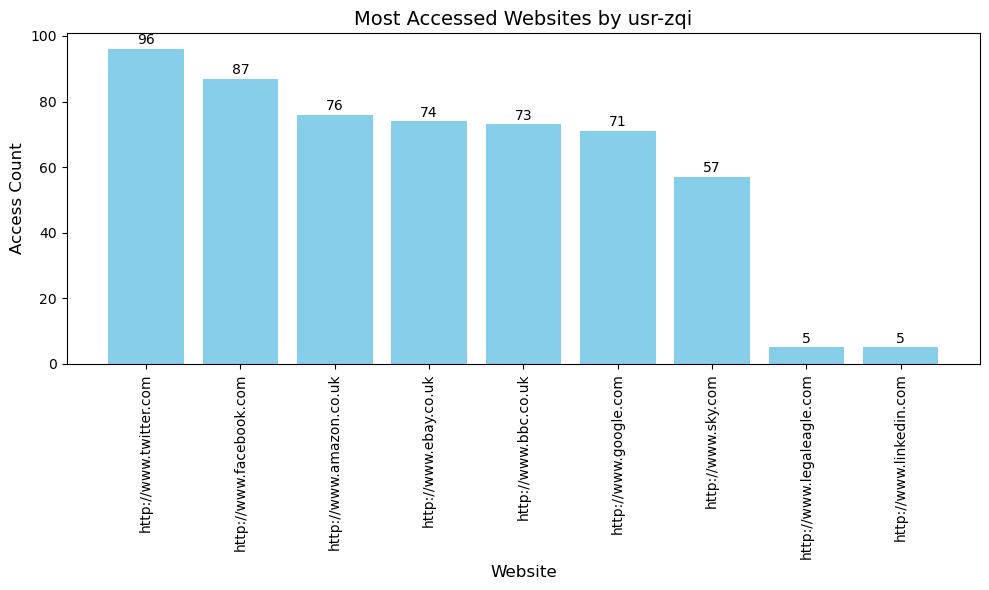

In [287]:
most_accessed_websites = (
    web_data[web_data['user'] == 'usr-zqi']
    .groupby('website')
    .size()
    .reset_index(name='access_count')
    .sort_values(by='access_count', ascending=False)
)

plt.figure(figsize=(10, 6))
bars = plt.bar(most_accessed_websites['website'], most_accessed_websites['access_count'], color='skyblue')

for bar in bars:
    plt.text(
        bar.get_x() + bar.get_width() / 2,  
        bar.get_height() + 0.5, 
        int(bar.get_height()),  
        ha='center',  
        va='bottom',  
        fontsize=10  
    )

plt.xlabel('Website', fontsize=12)
plt.ylabel('Access Count', fontsize=12)
plt.title('Most Accessed Websites by usr-zqi', fontsize=14)
plt.xticks(rotation=90) 

plt.tight_layout() 
plt.show()


### The above bar plot shows that 'http://www.linkedin.com' is one of the two least visited sites. we have already established 'usr-qui' has visited this website when he used USB on pc99.

### The node-link diagram below shows the email sent by directors 

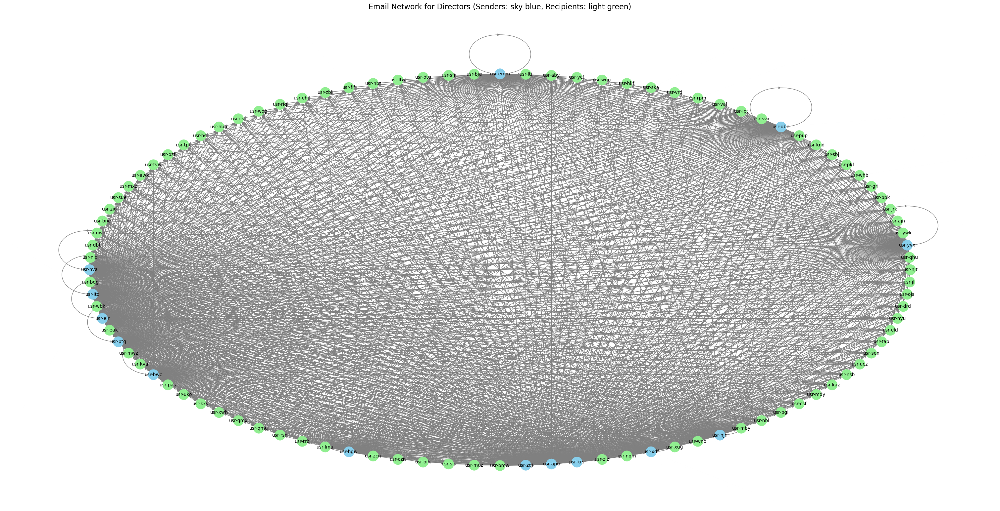

In [288]:
email_data['sender_user2'] = email_data['sender'].str.extract(r'(usr-\w+)')
email_data['recipient_user2'] = email_data['recipient'].str.extract(r'(usr-\w+)')

merged_email_data = pd.merge(email_data, employee_data, left_on='sender_user2', right_on='user', how='inner')

director_emails = merged_email_data[merged_email_data['role'] == 'Director']

G = nx.DiGraph()

for _, row in director_emails.iterrows():
    G.add_edge(row['sender_user2'], row['recipient_user2'])

node_colors = []
for node in G.nodes:
    if node in director_emails['sender_user2'].values:
        node_colors.append('skyblue')  
    else:
        node_colors.append('lightgreen')  

plt.figure(figsize=(30, 15))
pos = nx.shell_layout(G)
nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=500, font_size=10, edge_color='gray')
plt.title("Email Network for Directors (Senders: sky blue, Recipients: light green)", fontsize=16)
plt.show()

### The diagram above shows nothing out of ordinary in 'usr-zqi' emails comparing to all the other directors.

### Question 7: Describe what you believe are the key findings of your investigation. You should clearly state the suspect identified, and the sequential order of suspicious events, including the date and time that these occurred. You should then provide your own critical reflection of what has occurred in this scenario, giving justification for any assumptions made. Limit your response to a maximum of 400 words. 

Please make clear which dataset you have used for your investigation.

#### (10 marks)

The above investigation of the dataset 'QuantumByteSystems' has lead me to the conclusion that the 'usr-zqi' is the employee that could be the cause of the recent security problems UWEteach organisation is facing. The following findings proves my point -
- No user in the dataset has ever used their usb on a PC that is not theirs, except 'usr-zqi' (assigned pc - 'pc35') who used it on 'pc99' 4 times (8 if you count 'insert' and 'remove'). pc99 belongs to 'usr-eak' who has the role 'Technical'. The timeline is :
    - 2018-04-22 19:45:35.263826 (usb_insert) - 2018-04-22 19:55:19.221029 (usb_remove) - PC99
    - 2018-04-22 19:47:25.300702 (usb_insert) - 2018-04-22 20:16:08.356949 (usb_remove) - PC99
    - 2018-04-24 03:51:30.708095 (usb_insert) - 2018-04-24 04:15:56.888653 (usb_remove) - PC99
    - 2018-04-24 07:12:44.173070 (usb_insert)- 2018-04-24 07:31:50.111437 (usb_remove) - PC99

- 'usr-zqi' is one of the 14 users who belong to the role 'director'. 'usr-zqi' is the only director who has used usb among them.
- out of all the 14 directors, 'usr-zqi' is the only user has accessed the file '/docs/clients' (5 times).
- all the 8 usb activities by 'usr-zqi' is on pc99, none of them was on his pc(pc35).
- when 'usr-zqi' used usb on pc99, 3 out of 4 times 'usr-eak' was logged out and there was no other activities on pc99 other than usb. only 1 time 'usr-eak' was logged in 'pc99', at that time '/security', '/system/source', and '/security/ids' (none of those files are accessed by any director which could be beause they cannot access) were accessed and an email was sent to another technical role user (2018-04-24 07:12:44.173070 - 2018-04-24 07:31:50.111437).


It is clear from the findings that 'usr-zqi' has participated in unauthorised and strange activities. According to my critical analysis, 'usr-zqi' using a USB drive on a pc that is not theirs (PC99) without a valid reason implies that they intend to access or transfer private information such as security files . They could also be trying transfer malicious software considering pc99 is used by technical role user . Repeated access to '/docs/clients' when no director access them is alo suspicous. The strange overlap of USB activity with the absence of PC99's user ('usr-eak') suggests intentional attempts to avoid recognition. The one time where 'usr-eak' was logged in suggests that there may have been neglect or cooperation. My assumptions come from the patterns of unusual behaviour relative to those of other users—especially directors—who don't engage in such activities.